# Data Collecting / Cleaning

In [ ]:
%pip install seaborn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from pylab import rcParams
rcParams['figure.figsize'] = 14, 8
plt.style.use("ggplot")

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import accuracy_score, log_loss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, NuSVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

import warnings
warnings.filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Loading dataset.

def load_dataset():
    df = pd.read_csv('/content/sample_data/my_paypal_creditcard.csv')
    return df


crd_df = load_dataset()

In [ ]:
# Make summarize to our dataset.

def print_summarize_dataset(dataset):
    print("Dataset dimension:")
    print(dataset.shape)
    print("First 10 rows of dataset:")
    print(dataset.head(10))
    print("Statistical summary:")
    print(dataset.describe())


print_summarize_dataset(crd_df)

Dataset dimension:
(156612, 31)
First 10 rows of dataset:
   Time        V1        V2        V3        V4        V5        V6        V7  \
0   0.0 -1.359807 -0.072781  2.536347  1.378155 -0.338321  0.462388  0.239599   
1   0.0  1.191857  0.266151  0.166480  0.448154  0.060018 -0.082361 -0.078803   
2   1.0 -1.358354 -1.340163  1.773209  0.379780 -0.503198  1.800499  0.791461   
3   1.0 -0.966272 -0.185226  1.792993 -0.863291 -0.010309  1.247203  0.237609   
4   2.0 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921  0.592941   
5   2.0 -0.425966  0.960523  1.141109 -0.168252  0.420987 -0.029728  0.476201   
6   4.0  1.229658  0.141004  0.045371  1.202613  0.191881  0.272708 -0.005159   
7   7.0 -0.644269  1.417964  1.074380 -0.492199  0.948934  0.428118  1.120631   
8   7.0 -0.894286  0.286157 -0.113192 -0.271526  2.669599  3.721818  0.370145   
9   9.0 -0.338262  1.119593  1.044367 -0.222187  0.499361 -0.246761  0.651583   

         V8        V9  ...       V21       V22    

In [ ]:
# Let's get more information.

crd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156612 entries, 0 to 156611
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    156612 non-null  float64
 1   V1      156612 non-null  float64
 2   V2      156611 non-null  float64
 3   V3      156611 non-null  float64
 4   V4      156611 non-null  float64
 5   V5      156611 non-null  float64
 6   V6      156611 non-null  float64
 7   V7      156611 non-null  float64
 8   V8      156611 non-null  float64
 9   V9      156611 non-null  float64
 10  V10     156611 non-null  float64
 11  V11     156611 non-null  float64
 12  V12     156611 non-null  float64
 13  V13     156611 non-null  float64
 14  V14     156611 non-null  float64
 15  V15     156611 non-null  float64
 16  V16     156611 non-null  float64
 17  V17     156611 non-null  float64
 18  V18     156611 non-null  float64
 19  V19     156611 non-null  float64
 20  V20     156611 non-null  float64
 21  V21     15

In [ ]:
# Check dataset for missing(NaN) values.

crd_df.isnull().sum()

Time      0
V1        0
V2        1
V3        1
V4        1
V5        1
V6        1
V7        1
V8        1
V9        1
V10       1
V11       1
V12       1
V13       1
V14       1
V15       1
V16       1
V17       1
V18       1
V19       1
V20       1
V21       1
V22       1
V23       1
V24       1
V25       1
V26       1
V27       1
V28       1
Amount    1
Class     1
dtype: int64

In [ ]:
# drop nan values

crd_df = crd_df.dropna()
crd_df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

# Data Exploration / Data Visualization

The next I will perform some basic EDA on the dataset to gain better insights from it.

Distribution of legit & fraudulent transactions

In [ ]:
def dist_of_frauds():
  frauds = crd_df.loc[crd_df['Class'] == 1]
  non_frauds = crd_df.loc[crd_df['Class'] == 0]
  print('Frauds ', len(frauds), ' transactions or ', round(crd_df['Class'].value_counts()[1]/len(crd_df)*100, 2), '% of the dataset')
  print('No Fraud ', len(non_frauds), ' transactions or ', round(crd_df['Class'].value_counts()[0]/len(crd_df)*100, 2), '% of the dataset')


dist_of_frauds()

Frauds  350  transactions or  0.22 % of the dataset
No Fraud  156261  transactions or  99.78 % of the dataset


Less than one percent of transaction data is fraudulent. This means that the dataset is rather UNBALANCED; Nearly one hundred percent of transactions are normal. Fraud cases are anomalies and therefore our model will perform anomaly detection to find out which transactions are fraudulent.

We do not want to use this dataframe as the base for our predictive models and analysis because we will get a lot of errors and our model will OVERFIT since it will assume that most transactions are not fraud. This will require us to modify the dataframe quite a bit later on so that we can create a model that will properly predict (patterns of) fraud.

What is meant by an imbalanced dataset?

When the majority of data items in your dataset represents items belonging to one class, we say the dataset is skewed or imbalanced.

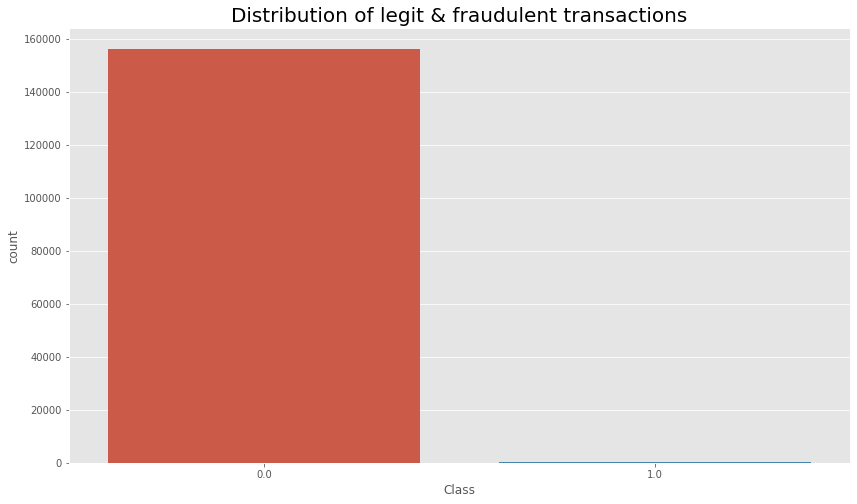

In [ ]:
def countplot_of_transaction():
  plt.title('Distribution of legit & fraudulent transactions', fontsize = 20)
  ax = sns.countplot(x='Class', data=crd_df)
  plt.show()


countplot_of_transaction()

As you can see, the dataset is completely and unambiguously skewed.


Since the number of fraudulent transactions in the count plot is not visible, let's depict it on a scatter plot. Only here the feature amount relation in the class is added.

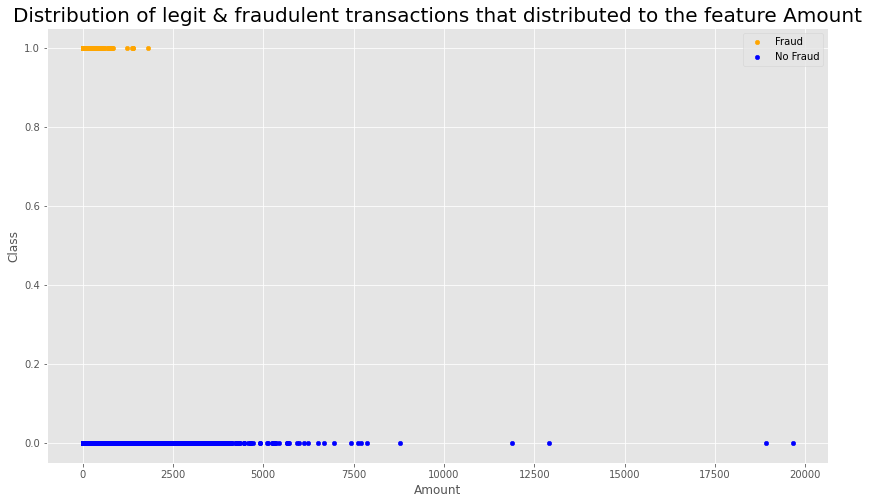

In [ ]:
def better_vis():
  frauds = crd_df.loc[crd_df['Class'] == 1]
  non_frauds = crd_df.loc[crd_df['Class'] == 0]
  ax = frauds.plot.scatter(x='Amount', y='Class', color='Orange', label='Fraud')
  plt.title('Distribution of legit & fraudulent transactions that distributed to the feature Amount', fontsize = 20)
  non_frauds.plot.scatter(x='Amount', y='Class', color='Blue', label='No Fraud', ax=ax)
  plt.show()


better_vis()

The next step is to understand Features: V1, V2, V3, ...?

FEATURE VECTORS IN PCA

The feature vector is simply a matrix that has as columns the eigenvectors of the components that we decide to keep.

Principal component analysis, or PCA, is a dimensionality-reduction method that is often used to reduce the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still contains most of the information in the large set.

Reducing the number of variables of a data set naturally comes at the expense of accuracy, but the trick in dimensionality reduction is to trade a little accuracy for simplicity. Because smaller data sets are easier to explore and visualize and make analyzing data much easier and faster for machine learning algorithms without extraneous variables to process.

Let's look ath the PCA features on 2D plane:

In [ ]:
def feat_of_pca_2D():
  X = crd_df.loc[:, 'V1':'V28']
  pca = PCA(n_components=2)
  components = pca.fit_transform(X)
  fig = px.scatter(components, x=0, y=1, color=crd_df['Class'])
  fig.show()


feat_of_pca_2D()

PCA features on 3D plane:

In [ ]:
def feat_of_pca_3D():
  X = X = crd_df.loc[:, 'V1':'V28']
  pca = PCA(n_components=3)
  components = pca.fit_transform(X)
  total_var = pca.explained_variance_ratio_.sum() * 100
  fig = px.scatter_3d(
      components, x=0, y=1, z=2, color=crd_df['Class'],
      title=f'Total Explained Variance: {total_var:.2f}%',
      labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
  )
  fig.show()


feat_of_pca_3D()

Behavior of the Time feature in both classes of Target:


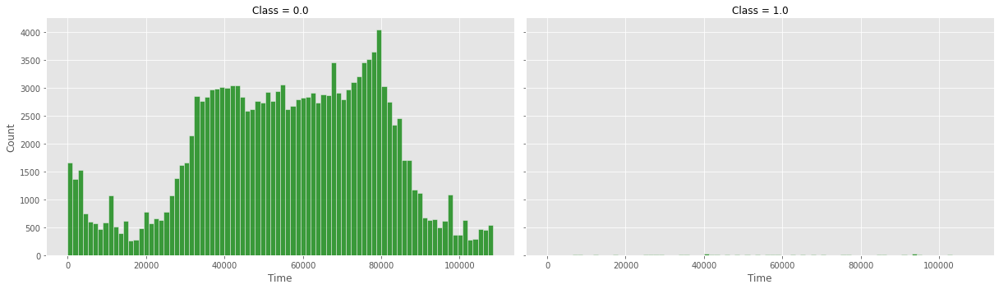

In [ ]:
def time_feat_in_cl():
  print('Behavior of the Time feature in both classes of Target:')
  sns.displot(x='Time', col='Class', data=crd_df, color='green', height=5, aspect=1.7)
  plt.show()


time_feat_in_cl()

Behavior of the Amount feature in both classes of Target:


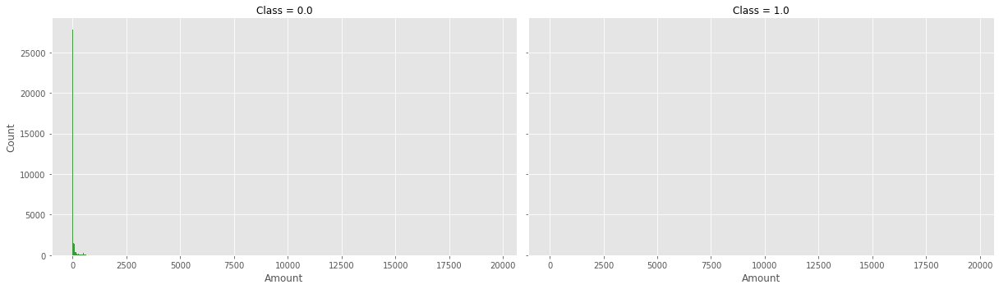

In [ ]:
def amount_feat_in_cl():
  print('Behavior of the Amount feature in both classes of Target:')
  sns.displot(x='Amount', col='Class', data=crd_df, color='green', height=5, aspect=1.7)
  plt.show()


amount_feat_in_cl()

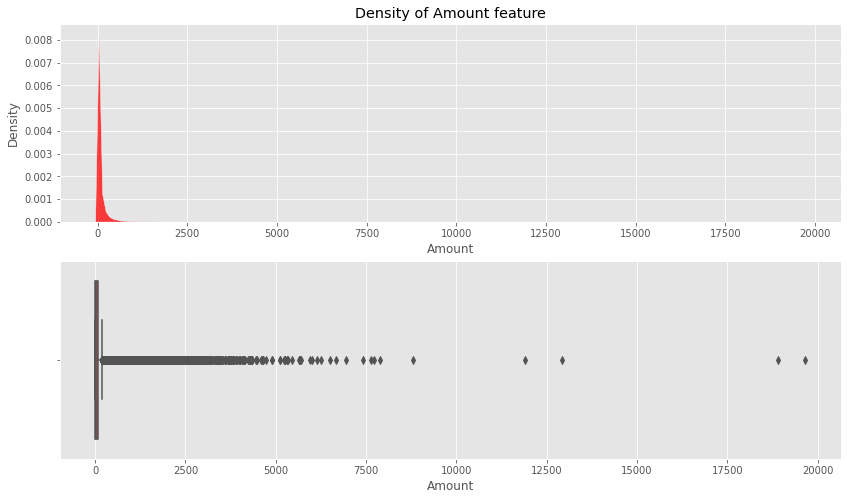

In [ ]:
def density_of_amount():
  figure, axis = plt.subplots(2, 1)
  sns.kdeplot(data=crd_df, x='Amount', multiple='stack', color='red', ax=axis[0])
  axis[0].set_title('Density of Amount feature')
  sns.boxplot(x=crd_df['Amount'], ax=axis[1])
  plt.show()


density_of_amount()

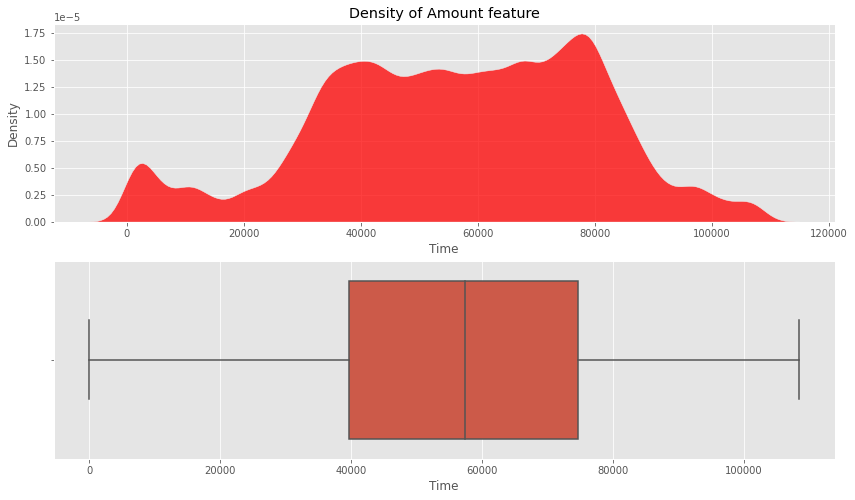

In [ ]:
def density_of_time():
  figure, axis = plt.subplots(2, 1)
  sns.kdeplot(data=crd_df, x='Time', multiple='stack', color='red', ax=axis[0])
  axis[0].set_title('Density of Amount feature')
  sns.boxplot(x=crd_df['Time'], ax=axis[1])
  plt.show()


density_of_time()

As you can see from the above six graphs, the data is completely IMBALANCED.
And it does not correspond to the law of normal distribution.
Undoubtedly, these can mislead the credit card fraud detection model.



Since this dataset is as close to reality as possible, let's at least carefully analyze the Time feature and make summaries on them.

Let's try to visualize the count of transaction over hours. We will first do it for the fraudlent users and next for non-fraudelent users:

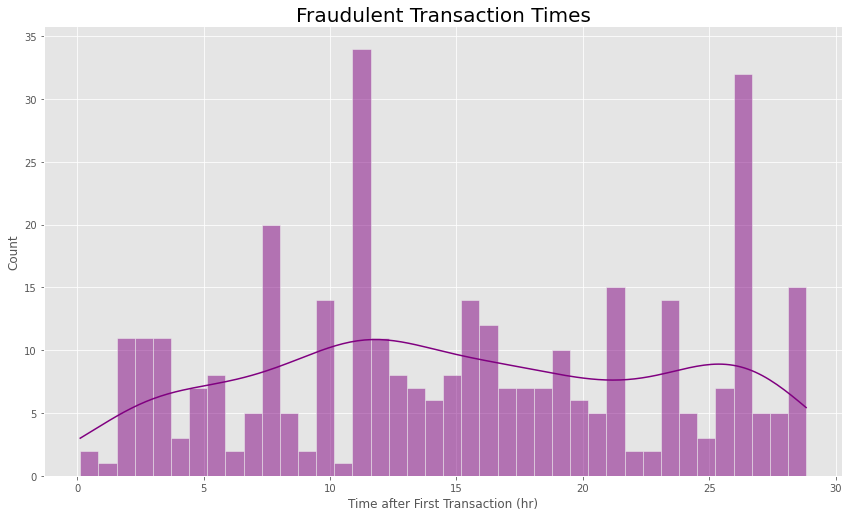

In [ ]:
def time_fr():
  df_fr = crd_df[crd_df['Class']==1]
  df_fr['Time'] = df_fr.loc[:, 'Time'] / 3600
  sns.displot(data=df_fr, x="Time", bins=40, kde=True, height=7, aspect=1.7, color='purple')
  plt.title('Fraudulent Transaction Times', fontsize=20)
  plt.xlabel('Time after First Transaction (hr)')
  plt.ylabel('Count')
  plt.show()


time_fr()

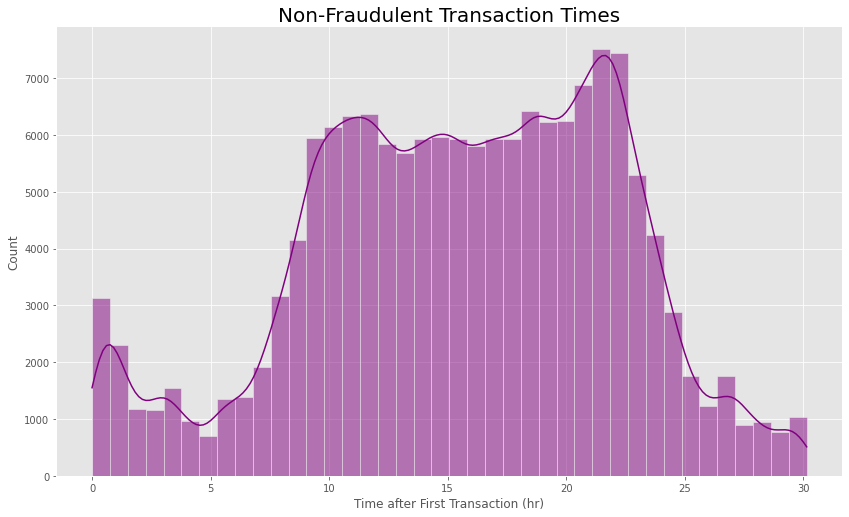

In [ ]:
def time_non_fr():
  df_fr = crd_df[crd_df['Class']==0]
  df_fr['Time'] = df_fr.loc[:, 'Time'] / 3600
  sns.displot(data=df_fr, x="Time", bins=40, kde=True, height=7, aspect=1.7, color='purple')
  plt.title('Non-Fraudulent Transaction Times', fontsize=20)
  plt.xlabel('Time after First Transaction (hr)')
  plt.ylabel('Count')
  plt.show()


time_non_fr()

As you can see, the number of transactions for genuine users take a hit during late night and early morning hours. It also makes sense since most people sleep during this. On the contrary, for fraudulent transactions, the number sees sharp spikes during late hours, and during the daytime, the count is significantly less.

Let's build and look at the correlation among the features. From the plot below, you can conclude that the features are not showing any strong correlation relationship among themselves. So we do not have to remove any feature based on correlation analysis.

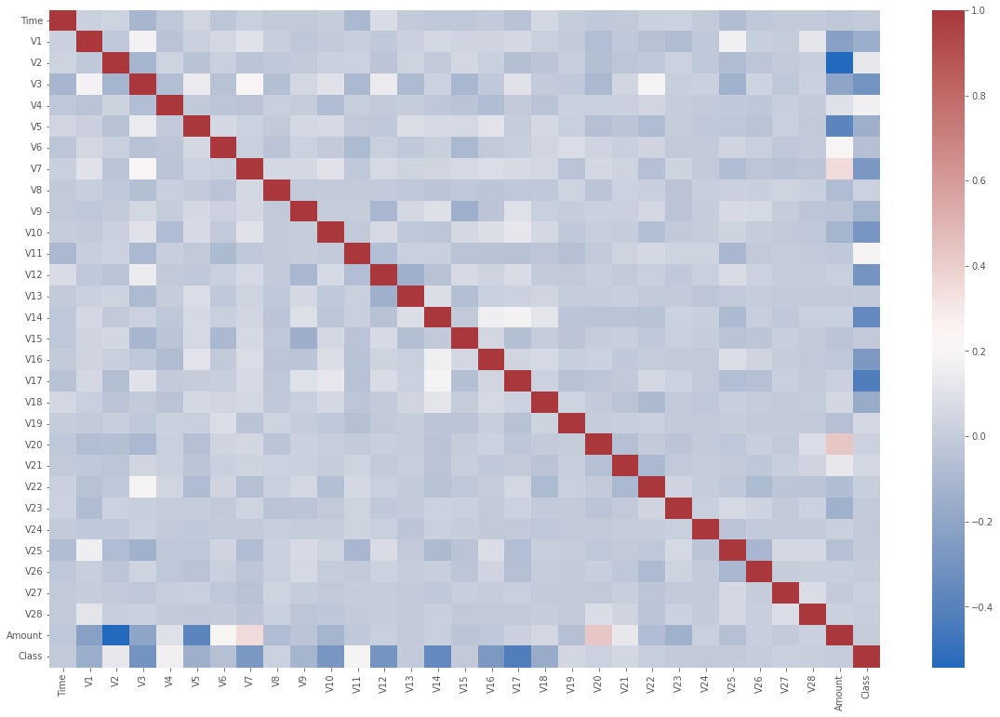

In [ ]:
def compute_correlations_matrix():
    corrMatrix = crd_df.corr()
    plt.figure(figsize=(20,13))
    sns.heatmap(corrMatrix, annot=False, cmap='vlag')
    plt.show()


compute_correlations_matrix()

Correlation with imbalanced data. As you can see that all features' correlation are negative, except the target.

## Scaling & Distributing


Scaling: If the data in any conditions has data points far from each other, scaling is a technique to make them closer to each other or in simpler words, we can say that the scaling is used for making data points generalized so that the distance between them will be lower.

I will be scaling the columns Time and Amount.

Distributing: Data distribution is a function that specifies all possible values for a variable and also quantifies the relative frequency (probability of how often they occur). Distributions are considered any population that has a scattering of data.

We will create a subsample of the dataframe in order to have an equal amount of Fraud and Non-Fraud cases of transaction. This will help our algorithm of ML better understand patterns that determines whether a transaction is a fraud or not.

The subsample will be a dataframe with a 50/50 ratio of fraud and non-fraud transactions. This is important to avoid overfitting and give us the correct correlations between the features.

We need to randomly choose the number of cases that represent
non-fraudulent transactions and put them in our new data frame.

Most of our data is already scaled, so we only need to scale the Time and Amount features, and for scaling them we use StandardScaler & RobustScaler:

Why we need feature scaling?

Feature scaling is the process of normalising the range of features in a dataset. Real-world datasets often contain features that are varying in degrees of magnitude, range and units. Therefore, in order for machine learning models to interpret these features on the same scale, we need to perform feature scaling.

In [ ]:
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

crd_df['scaled_amount'] = rob_scaler.fit_transform(crd_df['Amount'].values.reshape(-1,1))
crd_df['scaled_time'] = rob_scaler.fit_transform(crd_df['Time'].values.reshape(-1,1))

crd_df.drop(['Time','Amount'], axis=1, inplace=True) # removing non-scaled time and amount from the dataframe

scaled_amount = crd_df['scaled_amount']
scaled_time = crd_df['scaled_time']

crd_df.drop(['scaled_amount', 'scaled_time'], axis=1, inplace=True) # remove from end
crd_df.insert(0, 'scaled_amount', scaled_amount) # place scaled amount at column 1
crd_df.insert(1, 'scaled_time', scaled_time) # place scaled time at column 2

# Amount and Time are now scaled!
crd_df.head()

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,1.767983,-1.643422,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.0
1,-0.268468,-1.643422,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0.0
2,4.942481,-1.643393,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0.0
3,1.405960,-1.643393,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.0
4,0.664310,-1.643365,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0.0


After scaling Time and Amount features, let's now deal with imbalanced data.

Why does it matter if the dataset is skewed?

When your dataset do not represent all classes of data equally, the model might overfit to the class that’s represented more in your dataset and become oblivious to the existence of the minority class. It might even give you a good accuracy but fail miserably in real life. In our example, a model that keeps predicting that there’s no cancer every single time will also have a good accuracy as the occurrence of cancer itself will be rare among the inputs. But it will fail when an actual case of cancer is subjected to classification, failing its original purpose.



There are two ways to deal with imbalanced data: Undersampling and Oversampling:
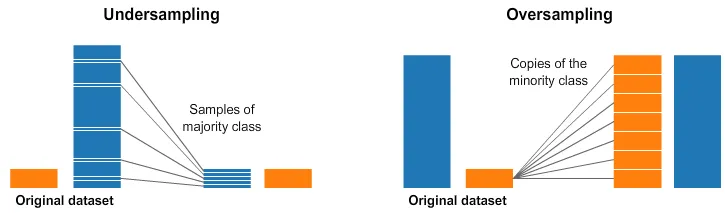

The next step:

Before I implement Random Undersampling, I should create testing set from the original dataframe so that I can test my model that created from the undersampled dataframe on the original df's test set.

In [ ]:
class SplitOriginDf:
    def __init__(self, dataframe):
        self.dataframe = dataframe

    def stratify(self):
        X = self.dataframe.drop('Class', axis=1)
        y = self.dataframe['Class']
        skf = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
        for train_index, test_index in skf.split(X, y):
            original_X_train, original_X_test = X.iloc[train_index], X.iloc[test_index]
            original_y_train, original_y_test = y.iloc[train_index], y.iloc[test_index]
            self.or_X_tr = original_X_train.values
            self.or_X_ts = original_X_test.values
            self.or_y_tr = original_y_train.values
            self.or_y_ts = original_y_test.values
        return self.or_X_tr, self.or_X_ts, self.or_y_tr, self.or_y_ts

    def distribution(self):
        train_unique_label, train_counts_label = np.unique(self.or_y_tr, return_counts=True)
        test_unique_label, test_counts_label = np.unique(self.or_y_ts, return_counts=True)
        print("\n", '-' * 100)
        print('\nLabel Distributions:')
        print(train_counts_label/len(self.or_y_tr))
        print(test_counts_label/len(self.or_y_ts))


split_or_df = SplitOriginDf(crd_df)
original_X_train, original_X_test, original_y_train, original_y_test = split_or_df.stratify()
dist_of_frauds()
print("\n", '-' * 100)
print("\noriginal_X_train:", original_X_train, "\noriginal_X_test:", original_X_test, "\noriginal_y_train:", original_y_train, "\noriginal_y_test:", original_y_test, sep='\n')
split_or_df.distribution()

Frauds  350  transactions or  0.22 % of the dataset
No Fraud  156261  transactions or  99.78 % of the dataset

 ----------------------------------------------------------------------------------------------------

original_X_train:
[[ 1.76798337 -1.64342194 -1.35980713 ... -0.18911484  0.13355838
  -0.02105305]
 [-0.26846847 -1.64342194  1.19185711 ...  0.12589453 -0.0089831
   0.01472417]
 [ 4.94248094 -1.64339334 -1.35835406 ... -0.13909657 -0.05535279
  -0.05975184]
 ...
 [ 3.03132363  0.80380914 -2.20763092 ... -0.13631228  1.08758482
   0.37383353]
 [-0.29189189  0.81204513 -3.36526492 ... -0.1350605   1.23869473
   0.09982376]
 [ 3.9966736   0.81213092 -3.58696386 ... -0.14984361  0.68551724
  -0.29972838]]

original_X_test:
[[ 3.83839224  0.57563235 -1.91427058 ... -0.59911303 -0.84431834
  -0.16837983]
 [-0.22661123  0.57563235 -1.2044041  ... -0.22132614  0.20552674
   0.09504238]
 [-0.24199584  0.57563235  1.23108776 ...  0.0682667  -0.03382803
   0.01192733]
 ...
 [-0.149549

Now, I will implement Random Undersampling:

This approach obviously has a flaw because I am losing a lot of information and drastically reducing the size of my new dataset by deleting so many transactions.

Let's shuffle the data before creating subsamples:

In [ ]:
def shuffle_and_create_new_df():
  df = crd_df.sample(frac=1)
  fraud_df = df.loc[df['Class'] == 1]
  non_fraud_df = df.loc[df['Class'] == 0][:len(fraud_df)]
  normal_distributed_df = pd.concat([fraud_df, non_fraud_df])
  new_df = normal_distributed_df.sample(frac=1, random_state=42)
  return new_df


new_df = shuffle_and_create_new_df()
new_df.head()

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
26802,-0.042134,-0.663797,0.539276,1.554890,-2.066180,3.241617,0.184736,0.028330,-1.515521,0.537035,...,0.302735,0.371773,0.111955,-0.305225,-1.053835,0.771175,0.240878,0.418435,0.232170,1.0
145683,-0.194872,0.848278,-0.940406,0.351437,-0.629582,-2.828589,2.014295,-1.373334,2.345166,-1.145491,...,0.362110,-0.121046,0.989233,0.052634,0.845456,-0.163779,0.394613,0.008183,-0.351516,0.0
130151,-0.291892,0.624190,-0.913182,0.510896,2.522466,-2.090902,-0.227774,-0.264574,0.579394,-0.166474,...,0.242819,-0.119763,0.355608,-0.396539,0.073773,0.488331,-0.778915,0.146627,-0.252068,0.0
153885,-0.295218,1.230622,-6.985267,5.151094,-4.599338,4.534479,0.849054,-0.210701,-4.425230,-5.134525,...,-1.246996,5.453672,-2.056177,-0.280334,0.120771,0.569358,0.145971,0.300193,1.779364,1.0
141259,6.794040,0.764574,-1.927453,1.827621,-7.019495,5.348303,-2.739188,-2.107219,-5.015848,1.205868,...,2.172709,1.376938,-0.792017,-0.771414,-0.379574,0.718717,1.111151,1.277707,0.819081,1.0


Let's look at its 50/50 distribution:

In [ ]:
print(new_df.shape)

(700, 31)


Distribution of the Classes in the subsample dataset
1.0    0.5
0.0    0.5
Name: Class, dtype: float64


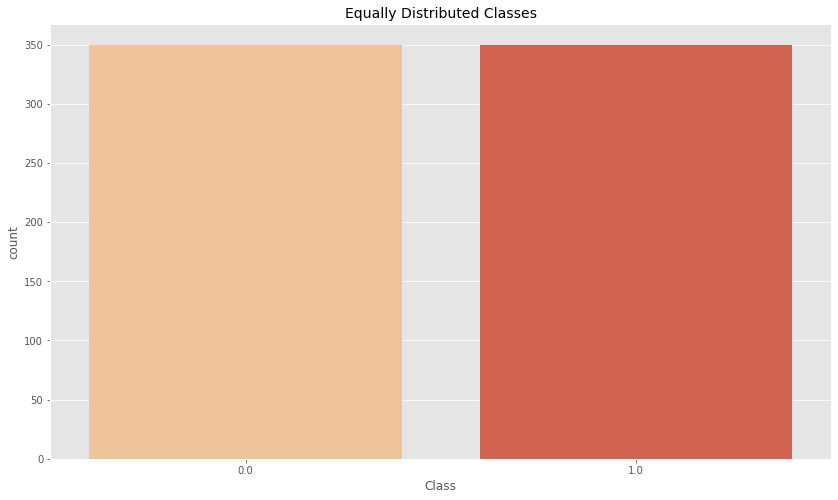

In [ ]:
def dist_of_newdf():
  print('Distribution of the Classes in the subsample dataset')
  print(new_df['Class'].value_counts()/len(new_df))

  sns.countplot('Class', data=new_df, palette='OrRd')
  plt.title('Equally Distributed Classes', fontsize=14)
  plt.show()


dist_of_newdf()

Now, just look at two cor.matrixes of original and new dataframes and analize:

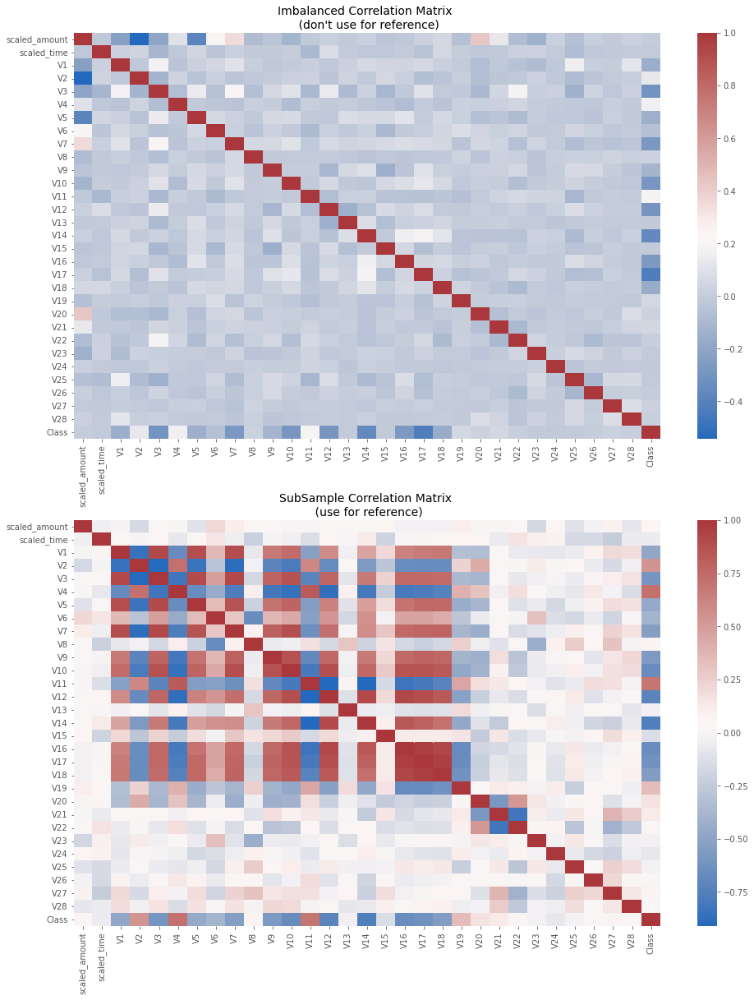

In [ ]:
def correlations_of_two_df():
  f, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 20))
  corr = crd_df.corr()
  sns.heatmap(corr, cmap='vlag', annot_kws={'size':20}, ax=ax1)
  ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)
  sub_sample_corr = new_df.corr()
  sns.heatmap(sub_sample_corr, cmap='vlag', annot_kws={'size':20}, ax=ax2)
  ax2.set_title("SubSample Correlation Matrix \n (use for reference)", fontsize=14)
  plt.show()


correlations_of_two_df()

The graph is lovely, but let's look at the correlations to determine which ones are more strongly positive and negative:

In [ ]:
most_pos_corr = (new_df.corr().where(np.triu(np.ones(new_df.corr().shape), k=1).astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))

print(most_pos_corr[0:9])
print(most_pos_corr[-9:-1])

V16  V17    0.962829
V17  V18    0.956101
V16  V18    0.931362
V12  V16    0.919263
V3   V7     0.912556
V1   V3     0.911526
V12  V14    0.904394
V3   V5     0.898814
V1   V7     0.894540
dtype: float64
V11  V16   -0.833685
V2   V5    -0.841949
V1   V2    -0.850238
V4   V10   -0.858601
     V12   -0.869765
V2   V7    -0.884040
     V3    -0.900463
V11  V12   -0.907320
dtype: float64


In [ ]:
# cor.value of every feature

print(new_df.corr()['Class'].sort_values(ascending=False))

Class            1.000000
V4               0.720589
V11              0.699181
V2               0.542087
V19              0.340531
V20              0.167447
V21              0.133267
V27              0.072110
V8               0.070442
scaled_amount    0.059849
V26              0.027611
V28              0.022686
V22              0.014651
V25             -0.020154
V23             -0.024996
V13             -0.034675
scaled_time     -0.056280
V24             -0.080658
V15             -0.136516
V6              -0.393824
V5              -0.458715
V1              -0.471212
V7              -0.537640
V18             -0.552408
V9              -0.563160
V3              -0.602597
V17             -0.623366
V16             -0.650824
V10             -0.663314
V12             -0.717424
V14             -0.755977
Name: Class, dtype: float64


The results show which factors have substantial positive and negative correlation. Some of them have a strong correlation.

Now, if we look at the second figure's bottom, we can see the relationship between the class and the features (fraud or not fraud). What we can make out is as follows:


The class has a strong positive correlation with V2, V4, V11, and V19. This implies that the likelihood of a fraud transaction increases with the value of one of these factors.

The class has a very strong negative correlation with V10, V12, V14, and V16. This implies that the likelihood of a fraud transaction increases with the value of one of these factors.

To better understand the distribution of these 8 traits in fraudulent and non-fraudulent transactions, let's use boxplots:

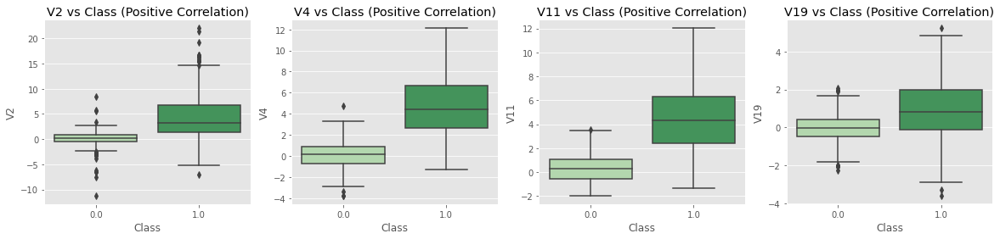

In [ ]:
def pos_corrs():
  f, axes = plt.subplots(ncols=4, figsize=(20,4))
  sns.boxplot(x="Class", y="V2", data=new_df, palette='Greens', ax=axes[0])
  axes[0].set_title('V2 vs Class (Positive Correlation)')
  sns.boxplot(x="Class", y="V4", data=new_df, palette='Greens', ax=axes[1])
  axes[1].set_title('V4 vs Class (Positive Correlation)')
  sns.boxplot(x="Class", y="V11", data=new_df, palette='Greens', ax=axes[2])
  axes[2].set_title('V11 vs Class (Positive Correlation)')
  sns.boxplot(x="Class", y="V19", data=new_df, palette='Greens', ax=axes[3])
  axes[3].set_title('V19 vs Class (Positive Correlation)')
  plt.show()


pos_corrs()

We can observe that when there is a fraudulent transaction, the attributes chosen here have a statistically larger value. Although we are unsure of what these characteristics actually signify, we at least have a rough idea of how they relate to the class. When we are further preparing our dataset for our model, this can be quite helpful.

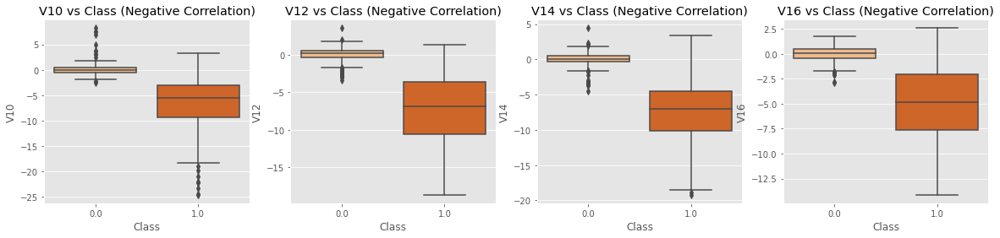

In [ ]:
def negative_corrs():
  f, axes = plt.subplots(ncols=4, figsize=(20,4))
  sns.boxplot(x="Class", y="V10", data=new_df, palette='Oranges', ax=axes[0])
  axes[0].set_title('V10 vs Class (Negative Correlation)')
  sns.boxplot(x="Class", y="V12", data=new_df, palette='Oranges', ax=axes[1])
  axes[1].set_title('V12 vs Class (Negative Correlation)')
  sns.boxplot(x="Class", y="V14", data=new_df, palette='Oranges', ax=axes[2])
  axes[2].set_title('V14 vs Class (Negative Correlation)')
  sns.boxplot(x="Class", y="V16", data=new_df, palette='Oranges', ax=axes[3])
  axes[3].set_title('V16 vs Class (Negative Correlation)')
  plt.show()


negative_corrs()

We can observe that when there is a fraudulent transaction, the attributes chosen here have a statistically lower value (in the negative figures).

Then We will be deleting the extreme outliers **(anomalies)** from those features in order to increase the precision of our models now that we know which features have the highest correlation with our classes.

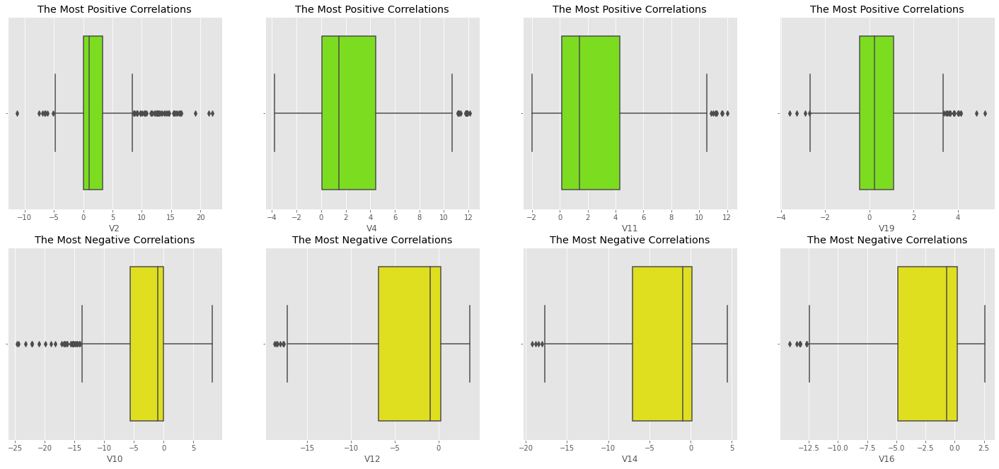

In [ ]:
def detect_anomalies():
    figure, axis = plt.subplots(2, 4,  figsize=(25, 11))
    sns.boxplot(x=new_df["V2"], ax=axis[0][0], color='lawngreen')
    axis[0][0].set_title("The Most Positive Correlations")
    sns.boxplot(x=new_df["V4"], ax=axis[0][1], color='lawngreen')
    axis[0][1].set_title("The Most Positive Correlations")
    sns.boxplot(x=new_df["V11"], ax=axis[0][2], color='lawngreen')
    axis[0][2].set_title("The Most Positive Correlations")
    sns.boxplot(x=new_df["V19"], ax=axis[0][3], color='lawngreen')
    axis[0][3].set_title("The Most Positive Correlations")
    sns.boxplot(x=new_df["V10"], ax=axis[1][0], color='yellow')
    axis[1][0].set_title("The Most Negative Correlations")
    sns.boxplot(x=new_df["V12"], ax=axis[1][1], color='yellow')
    axis[1][1].set_title("The Most Negative Correlations")
    sns.boxplot(x=new_df["V14"], ax=axis[1][2], color='yellow')
    axis[1][2].set_title("The Most Negative Correlations")
    sns.boxplot(x=new_df["V16"], ax=axis[1][3], color='yellow')
    axis[1][3].set_title("The Most Negative Correlations")
    plt.show()


detect_anomalies()

Since there is so little data, I will not remove outliers in all features, except for the feature with the highest outlier and the most negative correlation: V10

In [ ]:
upper_limit = new_df["V10"].mean() + 3*new_df["V10"].std()
lower_limit = new_df["V10"].mean() - 3*new_df["V10"].std()
print('upper limit:', upper_limit)
print('lower limit:', lower_limit)

upper limit: 11.972748995473218
lower limit: -18.67559468164464


In [ ]:
new_df.loc[(new_df["V10"] > upper_limit) | (new_df["V10"] < lower_limit)]

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
154587,-0.305752,1.276749,-28.255053,21.467203,-26.871339,11.737436,-17.999630,6.065901,-41.506796,-38.987263,...,10.440718,-21.453736,8.361985,4.909111,0.098328,-1.508739,0.008711,-5.407824,-0.183811,1.0
154684,-0.305613,1.289847,-28.709229,22.057729,-27.855811,11.845013,-18.983813,6.474115,-43.557242,-41.044261,...,11.059004,-22.797604,8.316275,5.466230,0.023854,-1.527145,-0.145225,-5.682338,-0.439134,1.0
153823,-0.274151,1.222672,-19.641857,14.706335,-22.801238,12.114672,-14.898113,0.840778,-28.011293,-11.919639,...,3.834649,-8.228874,3.318178,2.585212,0.195009,-1.194803,0.038423,-4.126746,-0.645329,1.0
154371,-0.274151,1.253843,-25.825982,19.167239,-25.390229,11.125435,-16.682644,3.933699,-37.060311,-28.759799,...,7.907378,-16.922016,5.703684,3.510019,0.054330,-0.671983,-0.209431,-4.950022,-0.448413,1.0
154234,-0.291892,1.242718,-23.984747,16.697832,-22.209875,9.584969,-16.230439,2.596333,-33.239328,-21.560039,...,5.804551,-12.615023,5.774087,2.750221,0.513411,-1.608804,-0.459624,-4.626127,-0.334561,1.0
151009,-0.291892,1.055064,-26.457745,16.497472,-30.177317,8.904157,-17.892600,-1.227904,-31.197329,-11.438920,...,2.812241,-8.755698,3.460893,0.896538,0.254836,-0.738097,-0.966564,-7.263482,-1.324884,1.0
151008,-0.291892,1.055064,-26.457745,16.497472,-30.177317,8.904157,-17.892600,-1.227904,-31.197329,-11.438920,...,2.812241,-8.755698,3.460893,0.896538,0.254836,-0.738097,-0.966564,-7.263482,-1.324884,1.0
151007,-0.291892,1.055064,-26.457745,16.497472,-30.177317,8.904157,-17.892600,-1.227904,-31.197329,-11.438920,...,2.812241,-8.755698,3.460893,0.896538,0.254836,-0.738097,-0.966564,-7.263482,-1.324884,1.0
151006,-0.291892,1.055064,-26.457745,16.497472,-30.177317,8.904157,-17.892600,-1.227904,-31.197329,-11.438920,...,2.812241,-8.755698,3.460893,0.896538,0.254836,-0.738097,-0.966564,-7.263482,-1.324884,1.0
153835,-0.291892,1.224817,-22.341889,15.536133,-22.865228,7.043374,-14.183129,-0.463145,-28.215112,-14.607791,...,4.100019,-9.110423,4.158895,1.412928,0.382801,0.447154,-0.632816,-4.380154,-0.467863,1.0


In [ ]:
newc_df = new_df.loc[(new_df["V2"] < upper_limit) & (new_df["V2"] > lower_limit)]
print('before removing outliers:', len(new_df))
print('after removing outliers:',len(newc_df))
print('outliers:', len(new_df)-len(newc_df))

before removing outliers: 700
after removing outliers: 665
outliers: 35


# Machine Learning

In [ ]:
X_new = newc_df.drop(columns='Class', axis=1)
y_new = newc_df['Class']

X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.2, stratify=y_new, random_state=2)

In [ ]:
class ClassifierModels:
    def __init__(self):
        self.classifiers = [
            KNeighborsClassifier(5),
            SVC(kernel="rbf", C=0.025, probability=True),
            NuSVC(probability=True),
            LogisticRegression(),
            GaussianNB()]

    def train_and_predict(self):
        log_cols=["Classifier", "Accuracy"]
        log = pd.DataFrame(columns=log_cols)

        for clf in self.classifiers:
            clf.fit(X_train, y_train)
            name = clf.__class__.__name__

            print("="*30)
            print(name)

            print('****Results****')
            X_train_predictions = clf.predict(X_train)
            acc = accuracy_score(X_train_predictions, y_train)
            print("Accuracy of the train new dataframe: {:.4%}".format(acc))

            X_test_predictions = clf.predict(X_test)
            accuracy = accuracy_score(X_test_predictions, y_test)
            print("Accuracy of the test new dataframe: {:.4%}".format(accuracy))

            X_test_or_predictions = clf.predict(original_X_test)
            or_acc = accuracy_score(X_test_or_predictions, original_y_test)
            print("Accuracy of the test original dataframe: {:.4%}".format(or_acc))

            log_entry = pd.DataFrame([[name, accuracy*100]], columns=log_cols)
            log = log.append(log_entry)

        print("="*30)
        self.df = log

    def accuracies(self):
        return self.df


cl = ClassifierModels()
cl.train_and_predict()

KNeighborsClassifier
****Results****
Accuracy of the train new dataframe: 94.5489%
Accuracy of the test new dataframe: 91.7293%
Accuracy of the test original dataframe: 97.5672%
SVC
****Results****
Accuracy of the train new dataframe: 90.7895%
Accuracy of the test new dataframe: 90.2256%
Accuracy of the test original dataframe: 99.2721%
NuSVC
****Results****
Accuracy of the train new dataframe: 91.3534%
Accuracy of the test new dataframe: 91.7293%
Accuracy of the test original dataframe: 99.2465%
LogisticRegression
****Results****
Accuracy of the train new dataframe: 96.2406%
Accuracy of the test new dataframe: 92.4812%
Accuracy of the test original dataframe: 95.3419%
GaussianNB
****Results****
Accuracy of the train new dataframe: 92.2932%
Accuracy of the test new dataframe: 92.4812%
Accuracy of the test original dataframe: 96.9031%


Pay attention only to "**Accuracy of the test new dataframe**"
As you can see, there is no **overfitting**.

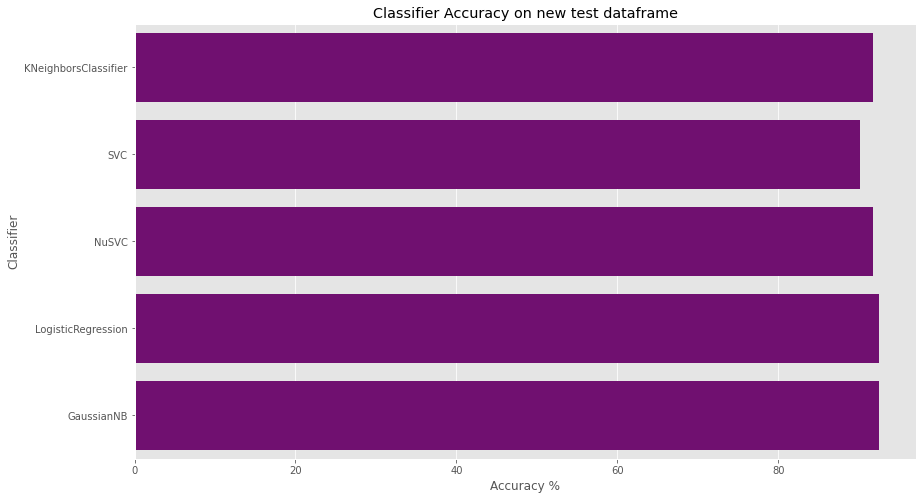

In [ ]:
def plot_acc():
    sns.set_color_codes("muted")
    sns.barplot(x='Accuracy', y='Classifier', data=cl.accuracies(), color="purple")
    plt.xlabel('Accuracy %')
    plt.title('Classifier Accuracy on new test dataframe')
    plt.show()


plot_acc()